<a href="https://colab.research.google.com/github/alltoy24/Alltoy24-s-RNG/blob/main/New_%ED%8C%8C%EC%9D%B4%EC%8D%AC_%EC%9D%98%EB%A3%8C_%EB%8D%B0%EC%9D%B4%ED%84%B0_%EB%B6%84%EC%84%9D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

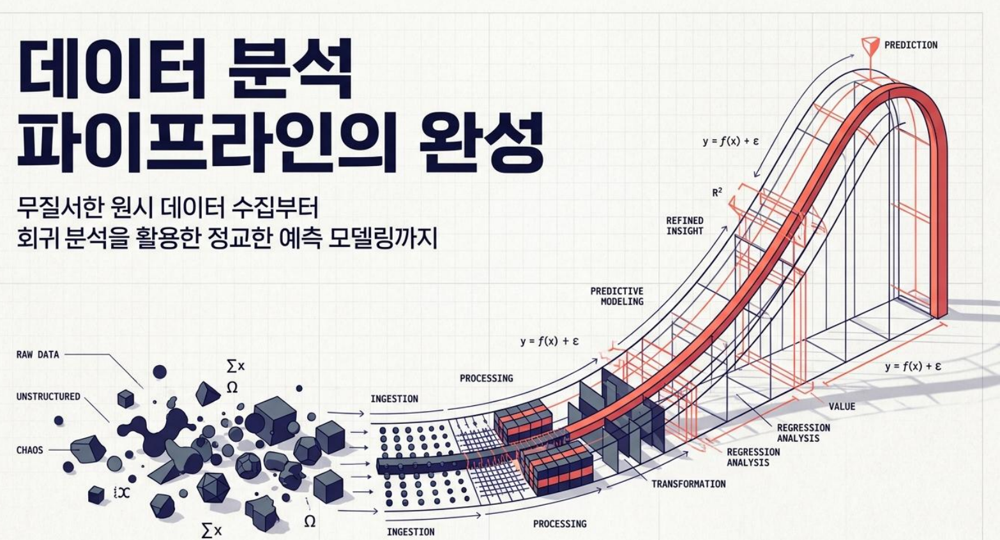

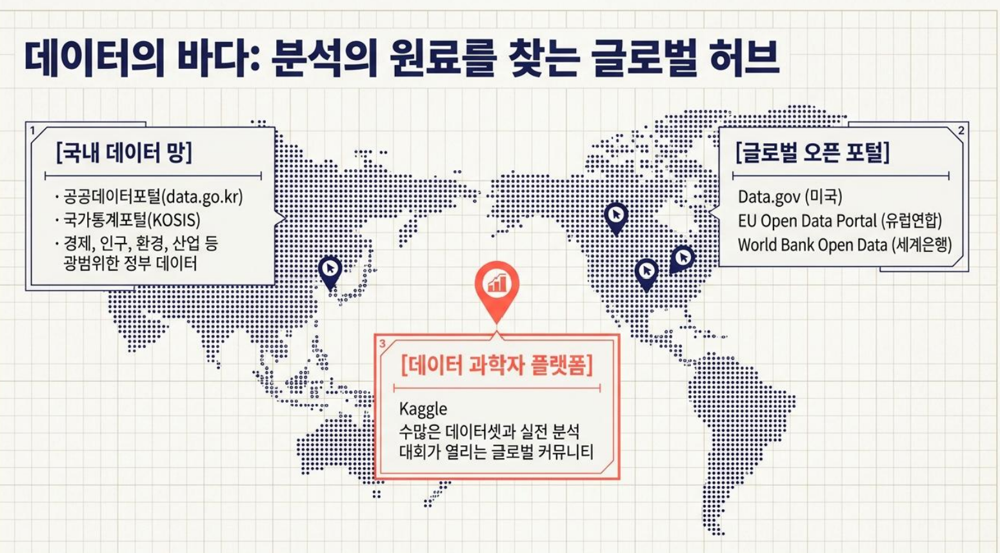

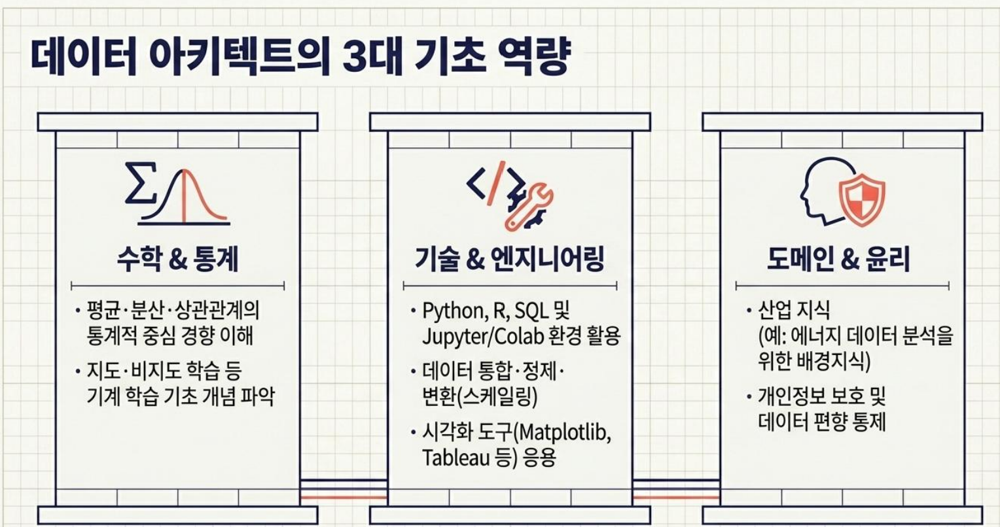

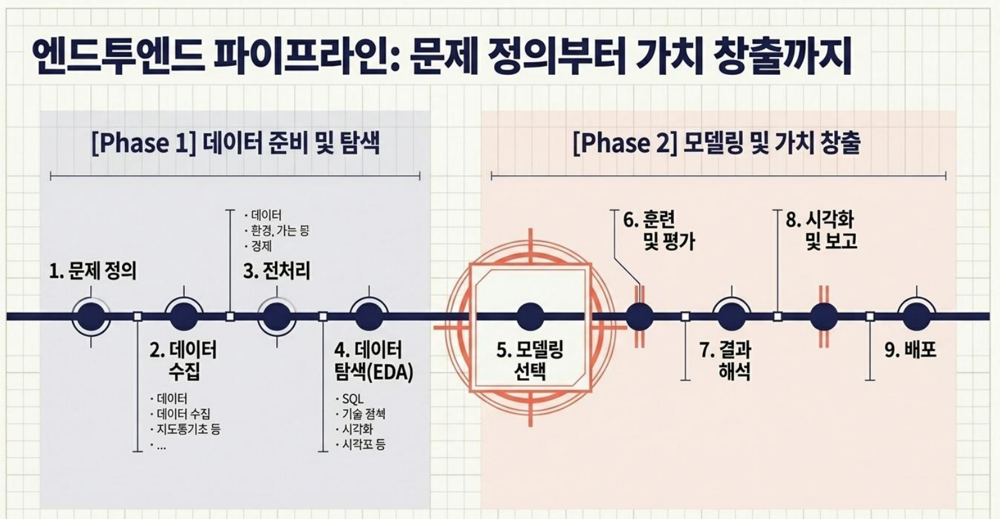

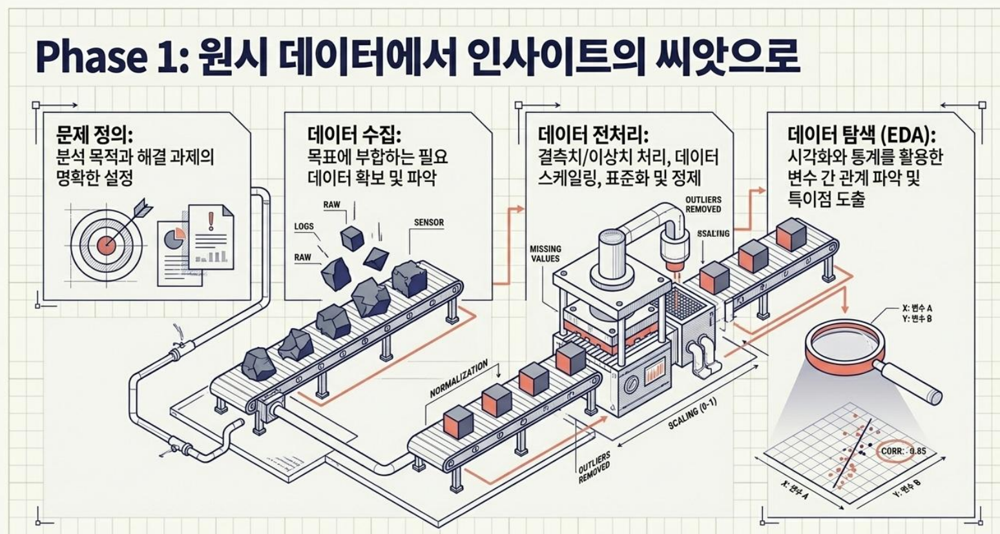

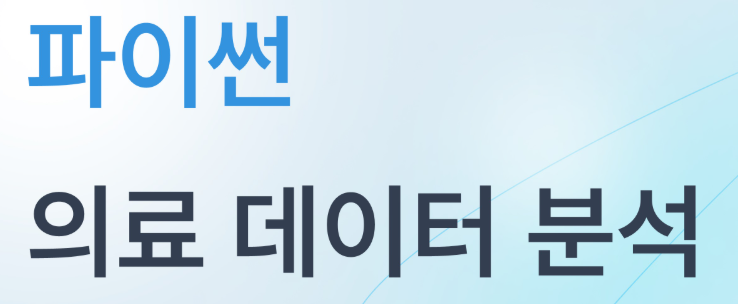

## **1. Kaggle, 심부전 데이터 설명**
- [캐글 심부전 데이터 출처 사이트 링크](https://www.kaggle.com/datasets/fedesoriano/heart-failure-prediction)

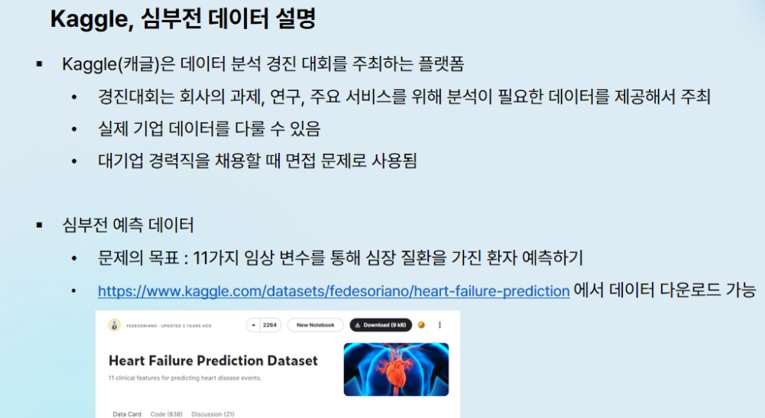

## **2. 심부전 데이터 변수 설명**

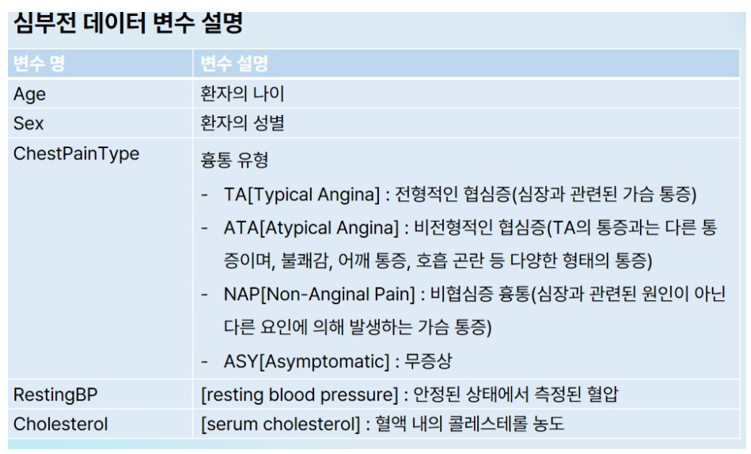

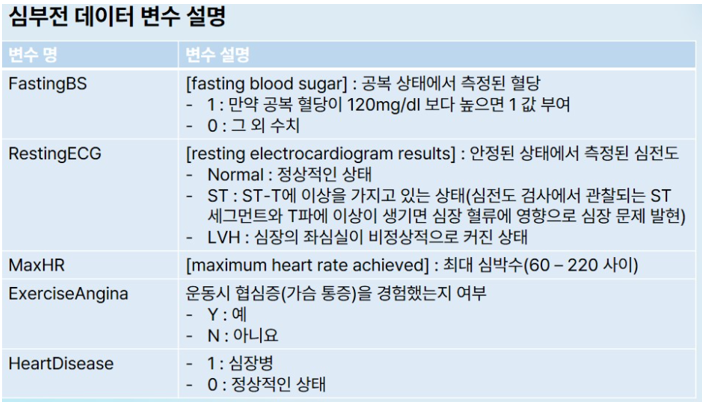

## **3. 심부전 데이터 분석 목표**

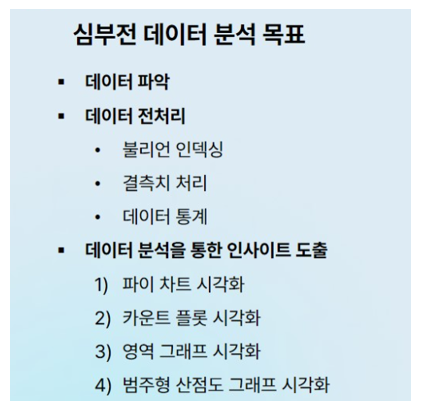

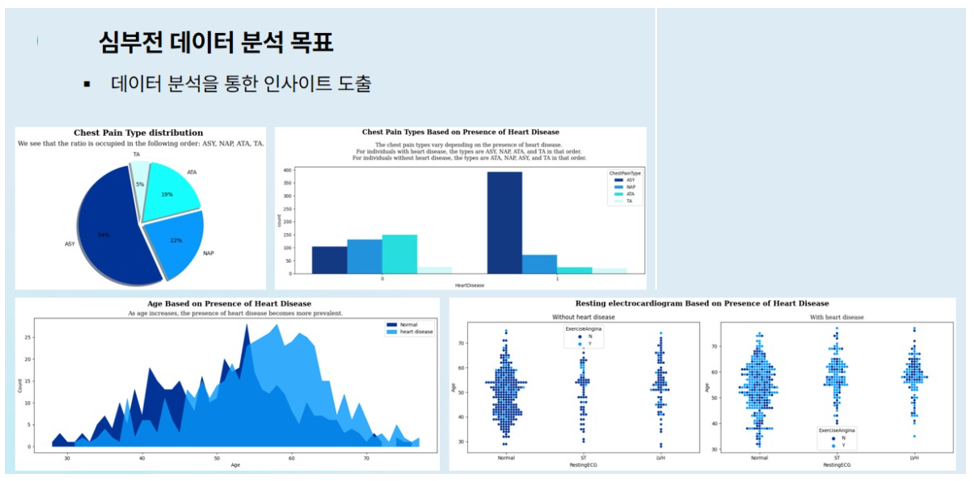

## **4. 심부전 데이터 분석 라이브러리 불러오기**

*   Pandas, Numpy, Matplotlib, Seaborn

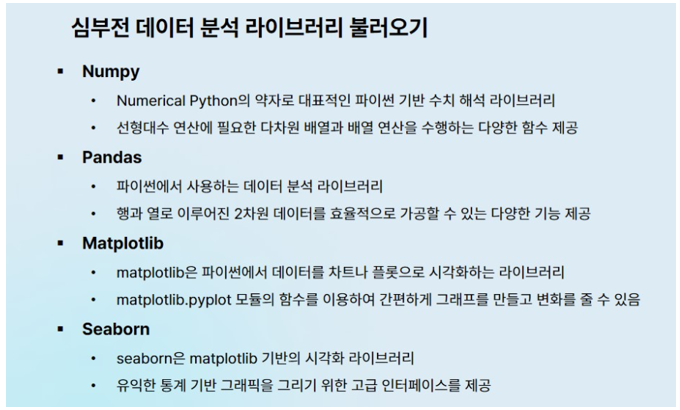

In [4]:
import numpy as np                   # numpy 로드하여 np로 사용
import pandas as pd                  # pandas 로드하여 pd로 사용
import matplotlib.pyplot as plt      # matplotlib.pyplot 로드하여 plt로 사용
import seaborn as sns                # seaborn 로드하여 sns로 사용

## **5. 심부전 데이터 불러오기**
- [heart.csv 파일 다운로드 링크](https://drive.google.com/file/d/1W-pgkgHPtd-cOjdllb9kI84WCBIl_ShC/view?usp=sharing)

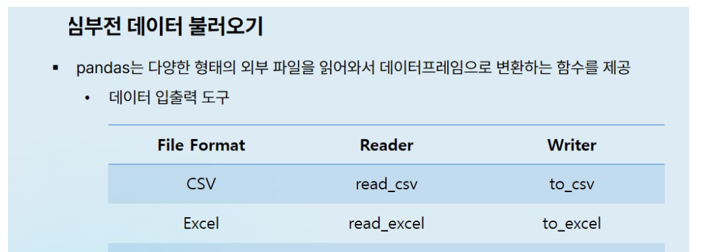

In [9]:
# csv 파일 읽어오기
# 심부전 데이터 불러와서 'heart'변수에 저장
heart = pd.read_csv("sample_data/heart.csv")

## **6. 심부전 데이터 내용 확인**
- `.columns` : 컬럼명 확인
- `.head(3)` : 데이터의 상단 3개 행 출력
- `.info()` : 데이터에 대한 전반적인 정보 제공
> - 행과 열의 크기
> - 컬럼명
> - 컬럼별 결측치
> - 컬럼별 데이터 타입

In [10]:
# .columns : 컬럼명 확인
heart.columns

Index(['Age', 'Sex', 'ChestPainType', 'RestingBP', 'Cholesterol', 'FastingBS',
       'RestingECG', 'MaxHR', 'ExerciseAngina', 'HeartDisease'],
      dtype='object')

In [12]:
# .head(3) : 데이터의 상단 3개 행 출력
heart.head(3)

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,HeartDisease
0,40,M,ATA,140.0,289,NaN,Normal,172,N,0.0
1,49,F,NAP,160.0,180,NaN,Normal,156,N,NaN
2,37,M,ATA,NaN,283,NaN,ST,98,N,NaN
3,48,F,ASY,NaN,214,NaN,Normal,108,Y,1.0
4,54,M,NAP,NaN,195,NaN,Normal,122,N,0.0


In [14]:
# .info() : 데이터에 대한 전반적인 정보 제공
heart.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             918 non-null    int64  
 1   Sex             918 non-null    object 
 2   ChestPainType   918 non-null    object 
 3   RestingBP       891 non-null    float64
 4   Cholesterol     918 non-null    int64  
 5   FastingBS       827 non-null    float64
 6   RestingECG      918 non-null    object 
 7   MaxHR           918 non-null    int64  
 8   ExerciseAngina  918 non-null    object 
 9   HeartDisease    916 non-null    float64
dtypes: float64(3), int64(3), object(4)
memory usage: 71.8+ KB


## **7. 심부전 데이터 특정 열 선택**

### **7-1. 특정 열 선택 (시리즈 반환)**

- 열 1개 선택 = 시리즈(Series) 객체 반환
- 데이터프레임의 열 데이터를 1개만 선택할 때는 2가지 방식
> - 대괄호([ ]) 안에 열 이름을 따옴표(“ ”또는 ' ')와 함께 입력
> - 도트(.) 다음에 열 이름을 입력

In [15]:
# 열 1개 선택 = 시리즈(Series) 객체 반환
# 대괄호([ ]) 안에 열 이름을 따옴표(“ ”)와 함께 입력
# 데이터 내용 확인

# 'ChestPainType' 변수 : 흉통 유형
# 1) TA[Typical Angina] : 전형적인 협심증(심장과 관련된 가슴 통증)
# 2) ATA[Atypical Angina] : 비전형적인 협심증(TA의 통증과는 다른 통증이며, 불쾌감, 어깨 통증, 호흡 곤란 등 다양한 형태의 통증)
# 3) NAP[Non-Anginal Pain] : 비협심증 흉통(심장과 관련된 원인이 아닌 다른 요인에 의해 발생하는 가슴 통증)
# 4) ASY[Asymptomatic] : 무증상

C = heart['ChestPainType']
C.head()

,ChestPainType
0,ATA
1,NAP
2,ATA
3,ASY
4,NAP


### **7-2. 특정 열 선택 (데이터프레임 반환)**

- 열 n개 선택 = 데이터프레임(DataFrame) 객체 반환
- 데이터프레임의 열 데이터를 n개 선택할 때는 1가지 방식
> - 2중 대괄호([[ ]]) 안에 열 이름을 따옴표(“ ”)와 함께 입력

In [17]:
# 열 n개 선택 = 데이터프레임(DataFrame) 객체 반환
# 2중 대괄호([[ ]]) 안에 열 이름을 따옴표(“ ”)와 함께 입력
# 'Age', 'ChestPainType' column만 추출하여 재 구성
# 데이터 내용 확인

# 'ChestPainType' 변수 : 흉통 유형
# 1) TA[Typical Angina] : 전형적인 협심증(심장과 관련된 가슴 통증)
# 2) ATA[Atypical Angina] : 비전형적인 협심증(TA의 통증과는 다른 통증이며, 불쾌감, 어깨 통증, 호흡 곤란 등 다양한 형태의 통증)
# 3) NAP[Non-Anginal Pain] : 비협심증 흉통(심장과 관련된 원인이 아닌 다른 요인에 의해 발생하는 가슴 통증)
# 4) ASY[Asymptomatic] : 무증상

AC = heart[['Age', 'ChestPainType']]
AC.head()

,Age,ChestPainType
0,40,ATA
1,49,NAP
2,37,ATA
3,48,ASY
4,54,NAP


## **8. 심부전 데이터 필터링**

In [18]:
# 'HeartDisease' 변수 : 심장병 여부
# 1) 1 : 심장병
# 2) 0 : 정상적인 상태

heart['HeartDisease'].head()

,HeartDisease
0,0.0
1,NaN
2,NaN
3,1.0
4,0.0


In [19]:
# 조건 : 심장병이 있는 사람의 데이터만 추출 (True, False 반환)

# 'HeartDisease' 변수 : 심장병 여부
# 1) 1 : 심장병
# 2) 0 : 정상적인 상태

heart['HeartDisease'] == 1

,HeartDisease
0,False
1,False
2,False
3,True
4,False
...,...
913,True
914,True
915,True
916,True


In [23]:
# 조건 : 심장병이 있는 사람의 데이터만 추출 (True, False 반환)
# 불리언(Boolean) 인덱싱 : 조건의 결과가 True 값인 행만 추출

# heart 데이터 안에 조건을 넣어주면 True 값인 행만 추출하여 심장병이 있는 사람의 데이터만 추출할 수 있음!
H = heart[heart['HeartDisease'] == 1]

H.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,HeartDisease
3,48,F,ASY,NaN,214,NaN,Normal,108,Y,1.0
8,37,M,ASY,NaN,207,NaN,Normal,130,Y,1.0
11,58,M,ATA,136.0,164,NaN,ST,99,Y,1.0
13,49,M,ASY,140.0,234,NaN,Normal,140,Y,1.0
16,38,M,ASY,110.0,196,NaN,Normal,166,N,1.0


## **9. 결측치 처리**

### **9-1. 결측치(Missing Value)**
- 데이터에 없는 것을 뜻함

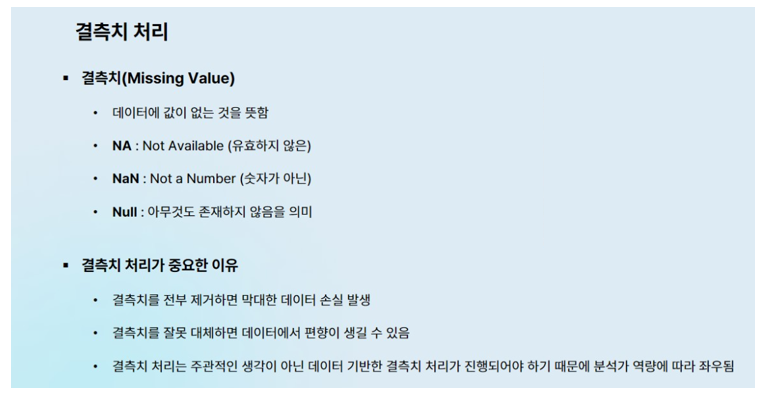

### **9-2. 결측치 비율에 따른 처리**

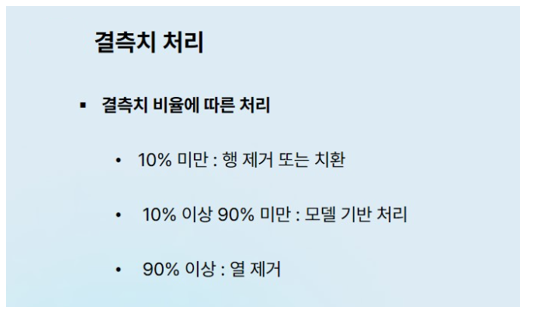

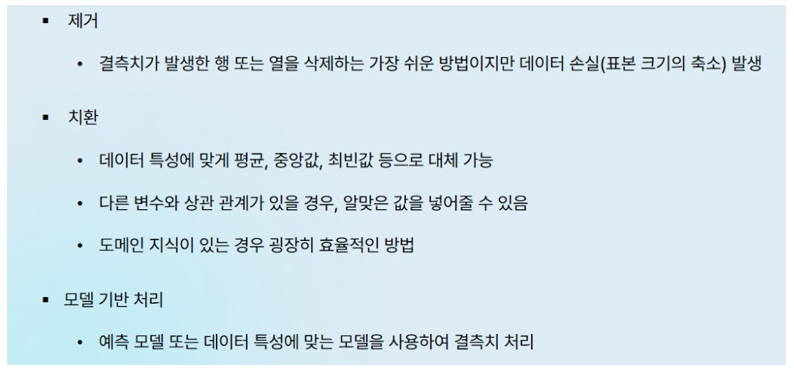

## **10. 심부전 데이터 결측치 비율 확인**
- for 반복문을 통해 각 컬럼별 결측치 비율을 계산하여 문자열로 출력


- `.isna( )` : 결측 값은 True 반환, 그 외에는 False 반환   ->   데이터프레임 내에 결측 값을 확인하기 위해 사용
              

In [24]:
# for 반복문을 통해 각 컬럼별 결측치 비율을 계산하여 문자열로 출력

# heart[i].isna().sum() : heart 데이터 열(column)의 결측치 개수의 합
# .isna( ) : 결측 값은 True 반환, 그 외에는 False 반환
# len(heart) : heart 데이터 행(row) 개수
# * 100 : 결측치 비율인 0.xx 를 보기 쉽게 표현하기 위해

# "문자열".format() : 문자열 포맷팅 기법으로 `{ }`에 차례대로 매핑
#                     `{0}`에는 i 매핑, `{1}`에는 round(missingValueRate, 2) 매핑
# round(missingValueRate, 2) : 소수점 2자리까지 반올림

for i in heart.columns :
    missingValueRate = heart[i].isna().sum() / len(heart) * 100
    if missingValueRate > 0 :
        print("{0} null rate: {1}%".format(i,round(missingValueRate, 2)))

RestingBP null rate: 2.94%
FastingBS null rate: 9.91%
HeartDisease null rate: 0.22%


## **11. 심부전 데이터 결측치 처리**
- `.fillna( )` : 결측 값을 특정 값으로 채우거나 대체하여 처리
- `.replace(np.nan, '문자')` : 결측치를 문자열 바꾸기 함수를 통해 처리
- `.dropna(axis = 0)` : 결측치가 있는 행 전체 제거
- `.dropna(axis = 1)` : 결측치가 있는 열 전체 제거
-  원본 객체를 변경하려면 inplace = True 옵션 추가


In [25]:
# 결측치 처리 (1) - fillna
# .fillna( ) : 결측치를 특정 값으로 채우거나 대체하여 처리
# 원본 데이터를 변경하려면, 함수 안에 `inplace = True` 옵션 추가
# 결측치 비율 : FastingBS(9.91%) : 918개 중에 91개 결측치

# FastingBS : 공복 상태에서 측정된 혈당
# 1) 1 : 만약 공복 혈당이 120mg/dl 보다 높으면 1 값 부여
# 2) 0 : 그 외 수치

# heart['FastingBS'].value_counts() ==> 0 : 619, 1 : 208
# FastingBS : 0으로 대체  -> 빈도수가 높은 값으로

heart['FastingBS'].fillna(0, inplace  = True)

/tmp/ipykernel_2333/4050022700.py:13: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  heart['FastingBS'].fillna(0, inplace  = True)


In [26]:
# 결측치 처리 (2) - replace
# .replace(np.nan, 'b') : 결측치를 문자열 바꾸기 함수를 통해 처리
# 원본 데이터를 변경하려면, 함수 안에 `inplace = True` 옵션 추가
# 결측치 비율 : RestingBP(2.94%) : 918개 중에 27개 결측치

# RestingBP : 안정된 상태에서 측정된 혈압

# heart['RestingBP'].median() ==> 130.0
# RestingBP : 중앙값으로 대체

#inplace = True : 원본 데이터를 수정하겠다는 뜻

heart['RestingBP'].replace(np.nan, heart['RestingBP'].median(), inplace = True)

/tmp/ipykernel_2333/4236640366.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  heart['RestingBP'].replace(np.nan, heart['RestingBP'].median(), inplace = True)


In [ ]:
# 결측치 처리 (3) - dropna
# .dropna(axis = 0) : 결측치가 있는 행 전체 제거
# 원본 데이터를 변경하려면, 함수 안에 `inplace = True` 옵션 추가
# 결측치 비율 : HeartDisease(0.22%) : 918개 중에 2개 결측치

# 'HeartDisease' 변수 : 심장병 여부
# 1) 1 : 심장병
# 2) 0 : 정상적인 상태

# HeartDisease : 결측치가 있는 행 전체 제거 (2줄)
heart.dropna(axis = 0, inplace = True)

In [ ]:
# 결측치 처리 확인 - info()
# 918행(결측치 처리 전) -> 916행(결측치 처리 후)
heart.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 916 entries, 0 to 917
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             916 non-null    int64  
 1   Sex             916 non-null    object 
 2   ChestPainType   916 non-null    object 
 3   RestingBP       916 non-null    float64
 4   Cholesterol     916 non-null    int64  
 5   FastingBS       916 non-null    float64
 6   RestingECG      916 non-null    object 
 7   MaxHR           916 non-null    int64  
 8   ExerciseAngina  916 non-null    object 
 9   HeartDisease    916 non-null    float64
dtypes: float64(3), int64(3), object(4)
memory usage: 78.7+ KB


## **12. 심부전 데이터 통계**
- `.mean()` : 평균값
- `.median()` : 중앙값
- `.describe()` : 다양한 통계량 요약
- `.groupby()` : 그룹별 집계
- `.value_counts()` : 값의 개수

In [34]:
# MaxHR 변수의 평균 구하기
# MaxHR: 달성된 최대 심박수 [60~202 사이의 숫자 값]
heart["MaxHR"].mean()

np.float64(136.80936819172112)

In [35]:
# MaxHR 변수의 중앙값 구하기
# MaxHR: 달성된 최대 심박수 [60~202 사이의 숫자 값]
heart["MaxHR"].median()

138.0

In [36]:
# describe() 함수를 통해 다양한 통계량 요약
# 카운트, 평균, 표준편차, 최솟값, 4분위 수를 기준으로 25%, 50%, 75%, 최댓값

# 특정 변수 'Age', 'MaxHR', 'Cholesterol' 추출

# MaxHR: 달성된 최대 심박수 [60~202 사이의 숫자 값]
# Cholesterol : 혈액 내의 콜레스테롤 농도

heart[['Age', 'MaxHR', 'Cholesterol']].describe()

,Age,MaxHR,Cholesterol
count,918.000000,918.000000,918.000000
mean,53.510893,136.809368,198.799564
std,9.432617,25.460334,109.384145
min,28.000000,60.000000,0.000000
25%,47.000000,120.000000,173.250000
50%,54.000000,138.000000,223.000000
75%,60.000000,156.000000,267.000000
max,77.000000,202.000000,603.000000


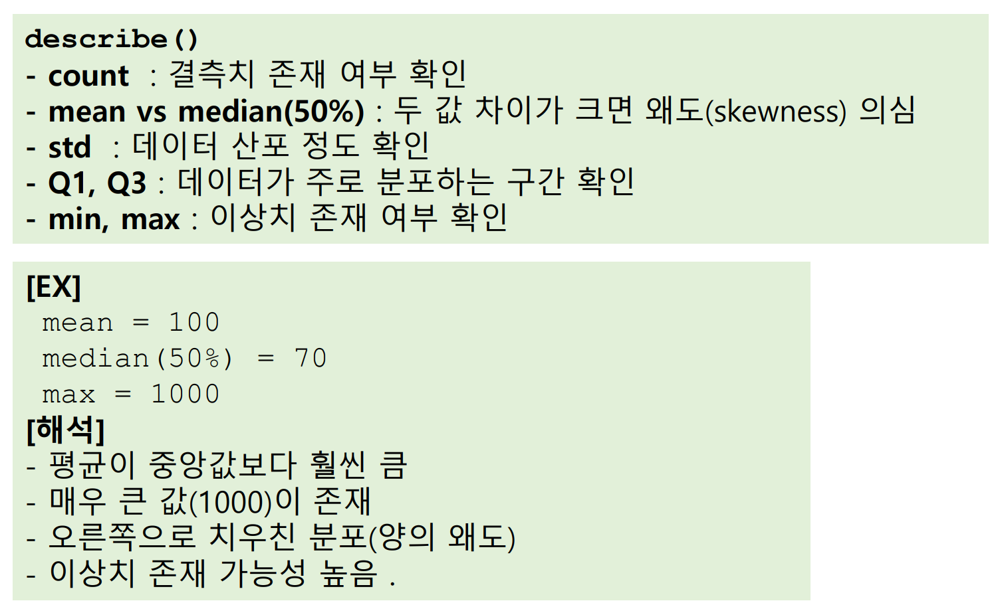

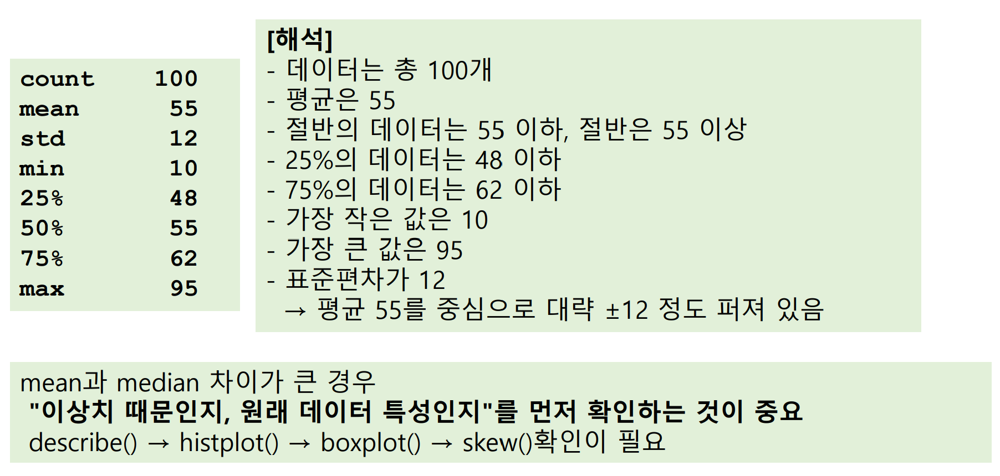

In [38]:
# groupby() 함수를 이용하여 그룹별 집계 <예제 1>
# groupby로 HeartDisease과 ChestPainType로 묶어주고
# Age, MaxHR, Cholesterol의 평균 구하기

# 'ChestPainType' 변수 : 흉통 유형
# 1) TA[Typical Angina] : 전형적인 협심증(심장과 관련된 가슴 통증)
# 2) ATA[Atypical Angina] : 비전형적인 협심증(TA의 통증과는 다른 통증이며, 불쾌감, 어깨 통증, 호흡 곤란 등 다양한 형태의 통증)
# 3) NAP[Non-Anginal Pain] : 비협심증 흉통(심장과 관련된 원인이 아닌 다른 요인에 의해 발생하는 가슴 통증)
# 4) ASY[Asymptomatic] : 무증상

# MaxHR: 달성된 최대 심박수 [60~202 사이의 숫자 값]
# Cholesterol : 혈액 내의 콜레스테롤 농도

heart.groupby(['HeartDisease', 'ChestPainType'])[['Age', 'MaxHR', 'Cholesterol']].mean()

Age       MaxHR  Cholesterol
HeartDisease ChestPainType                                    
0.0          ASY            52.317308  138.548077   226.865385
             ATA            48.236486  152.621622   232.668919
             NAP            51.045802  150.641221   221.503817
             TA             54.692308  150.500000   222.730769
1.0          ASY            55.660714  125.806122   175.974490
             ATA            55.958333  137.500000   233.291667
             NAP            57.549296  129.394366   153.281690
             TA             55.000000  144.500000   186.700000

In [39]:
# groupby() 함수를 이용하여 그룹별 집계 <예제 2>
# groupby를 통해 Sex 묶어주고 RestingBP 평균 구하기

# RestingBP : 안정된 상태에서 측정된 혈압

heart.groupby('Sex')['RestingBP'].mean()

,RestingBP
Sex,
F,132.264249
M,132.417931


In [40]:
# .value_counts( ) 함수를 이용하여 개수 구하기
# 'ChestPainType' 변수 : 흉통 유형
# 1) TA[Typical Angina] : 전형적인 협심증(심장과 관련된 가슴 통증)
# 2) ATA[Atypical Angina] : 비전형적인 협심증(TA의 통증과는 다른 통증이며, 불쾌감, 어깨 통증, 호흡 곤란 등 다양한 형태의 통증)
# 3) NAP[Non-Anginal Pain] : 비협심증 흉통(심장과 관련된 원인이 아닌 다른 요인에 의해 발생하는 가슴 통증)
# 4) ASY[Asymptomatic] : 무증상

heart['ChestPainType'].value_counts()

,count
ChestPainType,
ASY,496
NAP,203
ATA,173
TA,46


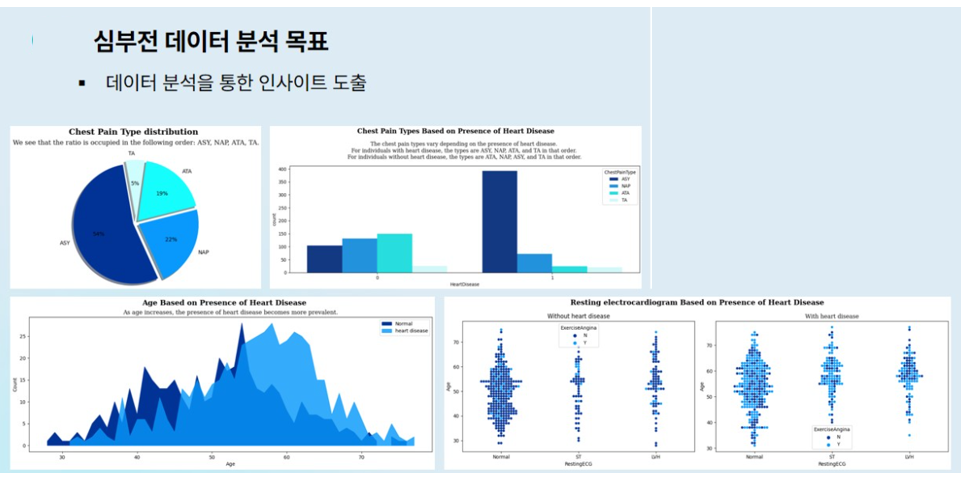

In [42]:
# 시각화 라이브러리 불러오기
import matplotlib.pyplot as plt
import seaborn as sns

## **13. 심부전 데이터 파이 차트 시각화**
- `plt.pie( )` : 파이 플롯 시각화
> - labels : 부채꼴 조각 이름
> - autopct : 부채꼴 안에 표기될 숫자 형식 지정
>              문자열 % 포맷팅으로 %0.f 형태는 소수점 없이 정수처럼 인식
>              진짜 %를 표시하기 위해 %%로 작성
> - startangle : 부채꼴이 그려지는 시작 각도 설정, 90이면 12시 방향
> - explode : 부채꼴이 파이 플롯의 중심에서 벗어나는 정도 설정
> - shadow : 그림자 효과 표시

- `plt.suptitle( )` : 전체 플롯의 제목
- `plt.title( )` : 서브 플롯의 제목


In [43]:
# heart['ChestPainType'].value_counts() : 'ChestPainType'인 흉통 유형 변수의 개수 출력

# 'ChestPainType' 변수 : 흉통 유형
# 1) TA[Typical Angina] : 전형적인 협심증(심장과 관련된 가슴 통증)
# 2) ATA[Atypical Angina] : 비전형적인 협심증(TA의 통증과는 다른 통증이며, 불쾌감, 어깨 통증, 호흡 곤란 등 다양한 형태의 통증)
# 3) NAP[Non-Anginal Pain] : 비협심증 흉통(심장과 관련된 원인이 아닌 다른 요인에 의해 발생하는 가슴 통증)
# 4) ASY[Asymptomatic] : 무증상

ratio = heart['ChestPainType'].value_counts()
ratio

,count
ChestPainType,
ASY,496
NAP,203
ATA,173
TA,46


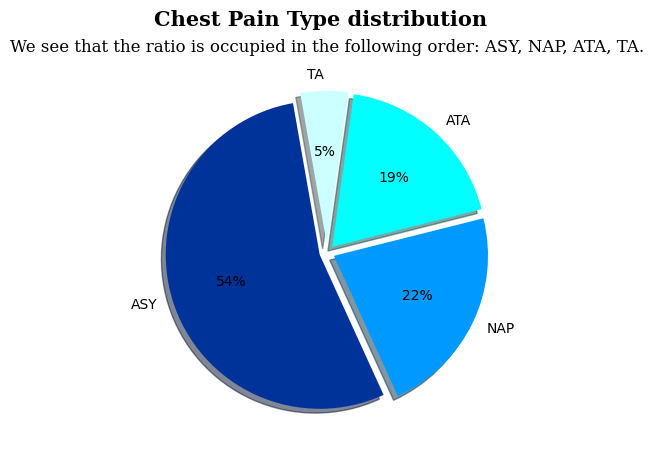

In [44]:
# pie plot 통해 'ChestPainType'인 흉통 유형 각각 비율 시각화

# plt.figure(figsize=(5, 5)) : 흰 도화지의 크기를 정해서 그래프 시각화
plt.figure(figsize=(5, 5))


# ratio : ratio에서 특정 행인 'ChestPainType'만 추출하여 1차원으로 변경하여 pie 차트에 x값으로 삽입

# plt.pie의 매개변수 설명
# labels : 부채꼴 조각 이름 (`ratio.index` : ratio의 행 이름 추출)
# autopct : 부채꼴 안에 표시될 숫자 형식 지정
#           문자열에서 % 포맷팅으로 %0.f 형태로 사용하면 소수점 없이 정수처럼 인식
#           진짜 %를 표시하기 위해 %%로 작성
# startangle : 부채꼴이 그려지는 시작 각도 설정, 90이면 12시 방향
# explode : 부채꼴이 파이 플롯의 중심에서 벗어나는 정도 설정
# shadow : 그림자 효과 표시
plt.pie(x=ratio, labels=ratio.index,
        autopct='%0.f%%', startangle=100,
        explode=[0.05, 0.05, 0.05, 0.05], shadow=True,
        colors=['#003399', '#0099FF', '#00FFFF','#CCFFFF'])

# plt.suptitle : 전체 플롯의 제목
# plt.title : 서브 플롯의 제목
plt.suptitle('Chest Pain Type distribution', fontfamily='serif', fontsize=15, fontweight='bold')
plt.title('We see that the ratio is occupied in the following order: ASY, NAP, ATA, TA.', fontfamily='serif', fontsize=12)

plt.show()



## **14. 심부전 데이터 카운트 플롯 시각화**
- `countplot( )` : 각 범주에 속하는 데이터의 개수를 막대 그래프 시각화
> - data : 카운트 플롯에서 사용할 데이터 셋
> - x : x축 설정
> - hue : 특정 열 데이터로 색상을 구분하여 출력



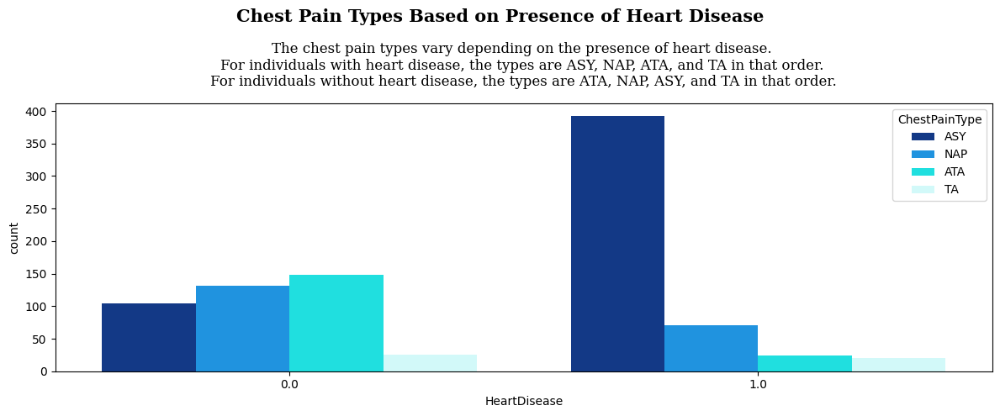

In [45]:
# 심부전증이 있을 때와 없을 때, 항상 ASY[Asymptomatic]인 무증상이 압도적인지 궁금!
# 'HeartDisease'여부에 따른 'ChestPainType'인 흉통 유형 시각화

# 'HeartDisease' 변수 : 심장병 여부
# 1) 1 : 심장병
# 2) 0 : 정상적인 상태

# 'ChestPainType' 변수 : 흉통 유형
# 1) TA[Typical Angina] : 전형적인 협심증(심장과 관련된 가슴 통증)
# 2) ATA[Atypical Angina] : 비전형적인 협심증(TA의 통증과는 다른 통증이며, 불쾌감, 어깨 통증, 호흡 곤란 등 다양한 형태의 통증)
# 3) NAP[Non-Anginal Pain] : 비협심증 흉통(심장과 관련된 원인이 아닌 다른 요인에 의해 발생하는 가슴 통증)
# 4) ASY[Asymptomatic] : 무증상


# plt.figure(figsize=(12, 5)) : 흰 도화지의 크기를 정해서 그래프 시각화
plt.figure(figsize=(12, 5))

# countplot( ) : 각 범주(삼장병 여부)에 속하는 데이터(흉통 유형)의 개수를 막대 그래프 시각화
# data : countplot에서 사용할 데이터 셋
# x : x축 설정
# hue : 특정 열 데이터로 색상을 구분하여 출력
# hue_order : 색상 순서를 수동으로 선택

sns.countplot(data=heart, x='HeartDisease', hue='ChestPainType',
              hue_order=["ASY", "NAP", "ATA", "TA"],
              palette=['#003399', '#0099FF', '#00FFFF','#CCFFFF'])

plt.suptitle('Chest Pain Types Based on Presence of Heart Disease', fontfamily='serif', fontsize=15, fontweight='bold')
plt.title('The chest pain types vary depending on the presence of heart disease. \nFor individuals with heart disease, the types are ASY, NAP, ATA, and TA in that order. \nFor individuals without heart disease, the types are ATA, NAP, ASY, and TA in that order.',
          fontfamily='serif', fontsize=12, pad = 15)

# plt.tight_layout() : 겹치지않도록 최소한의 여백을 만들어주는 역할
plt.tight_layout()
plt.show()

## **15. 심부전 데이터 영역 그래프 시각화**
- `unstack( )` : 인덱스를 컬럼으로 바꾸는 역할
> - <-> stack( ) : 컬럼을 인덱스로 바꾸는 역할
- `fill_between( )` : x축을 기준으로 그래프 영역을 채우는 함수
> - <-> fill_betweenx( ) : y축을 기준으로 그래프 영역을 채우는 함수
> - x : 곡선을 정의하는 노드의 x 좌표
> - y1 : 첫 번째 곡선을 정의하는 노드의 y 좌표
> - y2 : 두 번째 곡선을 정의하는 노드의 y 좌표
> - label : 'Movie', 'TV Show' 문자열 입력
> - alpha : 투명도

- `xticks(x, month_name)` : x축의 눈금 레이블에 month_name 값의 순서대로 설정


In [46]:
# 나이에 따른 심부전 여부 수치 시각화

# .groupby( ) : 그룹별 집계, 나이로 묶고 심부전증 여부의 개수 구하기
# .value_counts( ) : 변수의 범주별 개수 출력
# .unstack( ) : 인덱스(행)를 컬럼(열)으로 바꾸는 역할(wide 포맷), level 매개변수에 바꿀 인덱스 지정
Heart_Age = heart.groupby('Age')['HeartDisease'].value_counts().unstack(level='HeartDisease')
Heart_Age.head()

HeartDisease,0.0,1.0
Age,,
28,1.0,NaN
29,3.0,NaN
30,1.0,NaN
31,1.0,1.0
32,3.0,2.0


In [47]:
heart.groupby('Age')['HeartDisease'].value_counts()

Age  HeartDisease
28   0.0             1
29   0.0             3
30   0.0             1
31   0.0             1
     1.0             1
                    ..
75   1.0             2
     0.0             1
76   0.0             1
     1.0             1
77   1.0             2
Name: count, Length: 95, dtype: int64

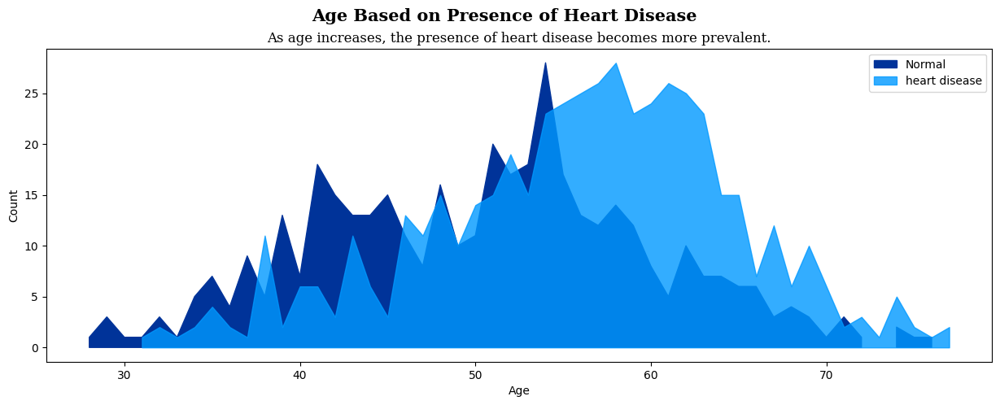

In [48]:
# 나이에 따른 심부전 여부 수치 시각화

# plt.figure(figsize=(15, 5)) : 흰 도화지의 크기를 정해서 그래프 시각화
plt.figure(figsize=(15, 5))

# fill_between() : x축을 기준으로 그래프 영역을 채우는 함수
# x : 곡선을 정의하는 노드의 x 좌표
# y1 : 첫 번째 곡선을 정의하는 노드의 y 좌표
# y2 : 두 번째 곡선을 정의하는 노드의 y 좌표
# alpha : 투명도
# label : 범례에 표시할 문자열 입력

# x=Heart_Age[0].index : Heart_Age 데이터의 심장병에 없는 환자들의 나이
# y1=0 : y 좌표 0부터 그래프 영역을 채워야해서 y1=0으로 설정
# y2=Heart_Age[0] : Heart_Age 데이터의 심장병에 없는 환자들의 나이별 숫자
plt.fill_between(x=Heart_Age[0].index, y1=0, y2=Heart_Age[0],
                 color='#003399', alpha=1, label = 'Normal')

# x=Heart_Age[1].index : Heart_Age 데이터의 심장병에 있는 환자들의 나이
# y1=0 : y 좌표 0부터 그래프 영역을 채워야해서 y1=0으로 설정
# y2=Heart_Age[1] : Heart_Age 데이터의 심장병에 있는 환자들의 나이별 숫자
plt.fill_between(x=Heart_Age[1].index, y1=0, y2=Heart_Age[1],
                 color='#0099FF', alpha=0.8, label = 'heart disease')

# legend() : 그래프에 범례 표시
plt.legend()

# xlabel() : 'X-Label' 입력하여 x축에 대한 레이블 표시
# ylabel() : 'Y-Label' 입력하여 y축에 대한 레이블 표시
plt.xlabel('Age')
plt.ylabel('Count')

plt.suptitle('Age Based on Presence of Heart Disease', fontfamily='serif', fontsize=15, fontweight='bold')
plt.title('As age increases, the presence of heart disease becomes more prevalent.', fontfamily='serif', fontsize=12)
plt.show()

## **16. 심부전 데이터의 범주형 산점도 그래프 시각화**
- swarmplot( ) 함수 : 데이터의 분산까지 고려하여 데이터 포인트가 서로 중복되지 않도록 시각화. 즉, 데이터가 퍼져 있는 정도를 입체적으로 파악 가능
- swarmplot( ) 함수의 파라미터
> - x축 변수
> - y축 변수
> - 데이터 셋
> - axe 객체
> - hue : 특정 열 데이터로 색상을 구분하여 출력

In [49]:
# 조건 : 심장병의 발병 여부에 따라 환자 데이터만 추출 (True, False 반환)
# 불리언(Boolean) 인덱싱 : 조건의 결과가 True 값인 행만 추출

# H_0 : 심장병이 없는 환자의 데이터 추출
# H_1 : 심장병이 있는 환자의 데이터 추출
H_0 = heart[heart['HeartDisease'] == 0]
H_1 = heart[heart['HeartDisease'] == 1]

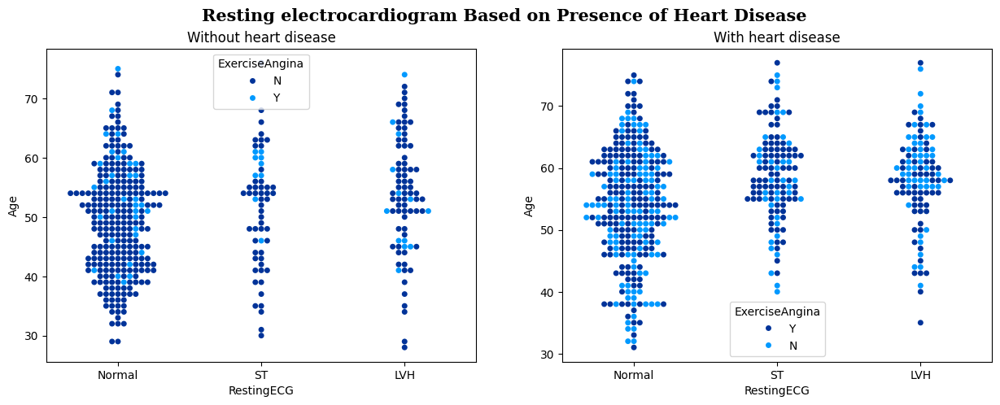

In [51]:
# 그래프 객체 생성 (figure에 2개의 서브 플롯을 생성)
# fig = plt.figure(figsize=(15, 5)) : 흰 도화지의 크기를 정해서 `fig`에 저장
# ax1 = fig.add_subplot(1, 2, 1) : 흰 도화지의 1행 2열의 첫 번째 구역에 그래프1 시각화
# ax2 = fig.add_subplot(1, 2, 2) : 흰 도화지의 1행 2열의 두 번째 구역에 그래프2 시각화
fig = plt.figure(figsize=(15, 5))
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)

# RestingECG : 안정된 상태에서 측정된 심전도
# ExerciseAngina : 운동시 협심증(가슴 통증)을 경험했는지 여부 [Y:예, N:아니오]

# 심장병이 없는 환자의 데이터에서 나이별 안정된 상태에서 측정된 혈압 수치 시각화
# 운동시 협심증 여부를 색상으로 구분하여 출력
# x축 변수, y축 변수, 데이터 셋, axe 객체(첫 번째 그래프), 색상 구분
sns.swarmplot(x='RestingECG', y='Age', data=H_0, ax=ax1, hue='ExerciseAngina',
              palette=['#003399', '#0099FF'])

# 심장병이 있는 환자의 데이터에서 나이별 안정된 상태에서 측정된 혈압 수치 시각화
# 운동시 협심증 여부를 색상으로 구분하여 출력
# x축 변수, y축 변수, 데이터 셋, axe 객체(두 번째 그래프), 색상 구분
sns.swarmplot(x='RestingECG', y='Age', data=H_1, ax=ax2, hue='ExerciseAngina',
              palette=['#003399', '#0099FF'])

plt.suptitle('Resting electrocardiogram Based on Presence of Heart Disease', fontfamily='serif', fontsize=15, fontweight='bold')
ax1.set_title('Without heart disease')
ax2.set_title('With heart disease')
plt.show()